In [12]:
%matplotlib inline

import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import pathlib
import pickle
from PIL import Image, ImageDraw
import sys
from tqdm import tqdm
from types import SimpleNamespace
from torch.utils.data import DataLoader

from framework.pytorch.datasets.images_group_dataset import ImagesGroupDataset
from framework.opencv.overlap_finder import BatchOverlapFinder, RANSAC_MatrixFinder, batch_homographies

from extern.superpoints_utils import SuperPointFrontend
from extern.superpoints_utils import apply_net_eval as apply_superpoints_eval


plt.rcParams['figure.figsize'] = [20, 10] 

BGR_BLUE = (255, 0, 0)
BGR_YELLOW = (0, 255, 255)
BGR_HALF_GREEN = (0, 128, 0)

def color_mask(mask):
    def color_cls(mask, cls_, color):
        mask_b = (mask == cls_).astype(np.uint8) * 255
        mask_c = cv2.cvtColor(mask_b, cv2.COLOR_GRAY2BGR)
        mask_c[mask_b == 255] = color
        return mask_c
    
    mask_c = cv2.addWeighted(color_cls(mask, 1, BGR_BLUE), 1, color_cls(mask, 2, BGR_YELLOW), 1, 0)
    mask_c = cv2.addWeighted(mask_c, 1, color_cls(mask, 3, BGR_HALF_GREEN), 1, 0)
    return mask_c

def compute_dimensions(composed_img, current_img, homography_matrix):
        h, w = composed_img.shape[:2]
        composed_corners = np.float32([ [0,0], [0,h-1], [w-1,h-1], [w-1,0] ]).reshape(-1,1,2).squeeze().astype(int)

        h, w = current_img.shape[:2]
        pts = np.float32([ [0, 0], [0, h-1], [w-1, h-1], [w-1, 0] ]).reshape(-1,1,2)
        next_corners = cv2.perspectiveTransform(pts, homography_matrix)
        next_corners = np.squeeze(next_corners)             # Remove extra dimensions
        next_corners = np.round(next_corners).astype(int)   # Convert to integer

        x_coord = np.concatenate([composed_corners, next_corners]).squeeze()[:,0]
        y_coord =  np.concatenate([composed_corners, next_corners]).squeeze()[:,1]

        max_x = x_coord.max()
        min_x = x_coord.min()
        max_y = y_coord.max()
        min_y = y_coord.min()

        return max_x, min_x, max_y, min_y


In [2]:

#list_path = './data_lists/platges2021_all.json'
#list_path = './data_lists/platges2022_all.json'
list_path = './data_lists/platges2022_concept.json'
data_root = ''
downsample = 4

#ann_path = '/mnt/c/Users/Ignasi/Downloads/platgesbcn2021/'
ann_path = '/mnt/c/Users/Ignasi/Downloads/FOTOS_BCN_2022-04-06/panorama_stiching/masks/'

dataset = ImagesGroupDataset(json_path=list_path, data_root=data_root, downsample=downsample, read_flag=cv2.IMREAD_COLOR)
def my_collate(x): # <- x is a batch like [dataset[i] for i in batched_indices]
    return x # <- do not transform imgs to tensor
dataloader = DataLoader(dataset, collate_fn=my_collate)


In [3]:

for batch in dataloader:
    for group in batch: # batch is list of (img, path) elements
        group_of_imgs, pathes = tuple(zip(*list(group)))
        
        break
    break

group_of_masks = []
    
for path in pathes:
    with open(f'{ann_path}/{os.path.basename(path)[:-4]}.segments.pkl', 'rb') as f:
        mask = pickle.load(f, encoding='latin1')
        mask = cv2.resize(mask, None, fx=1/downsample, fy=1/downsample, interpolation=cv2.INTER_NEAREST)
        if True:
            mask[mask == 1] = 4
            mask[mask == 2] = 1
            mask[mask == 4] = 2
    group_of_masks.append(mask)
    
group_of_imgs = group_of_imgs[::-1]
group_of_masks = group_of_masks[::-1]

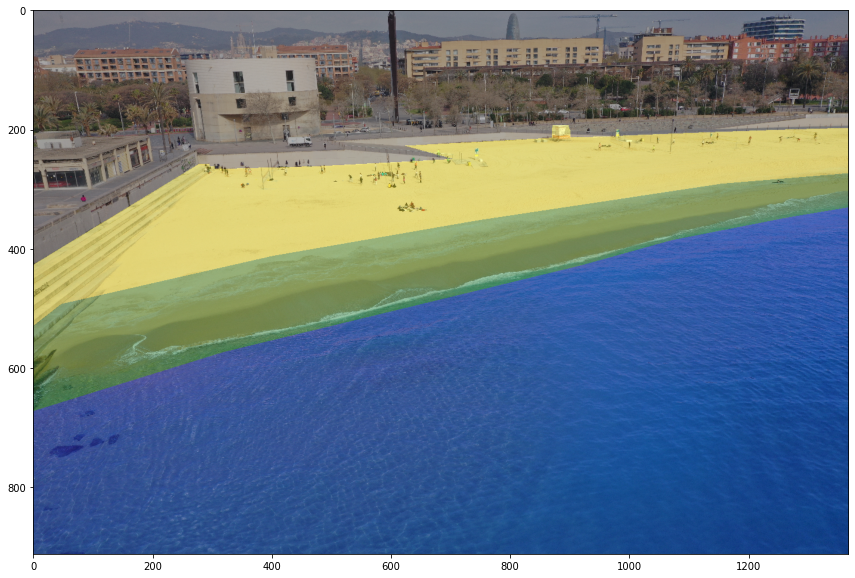

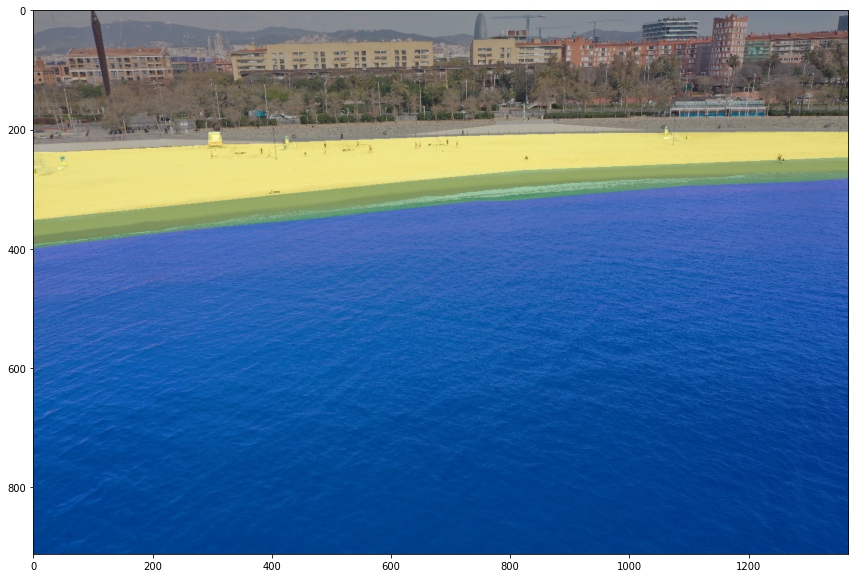

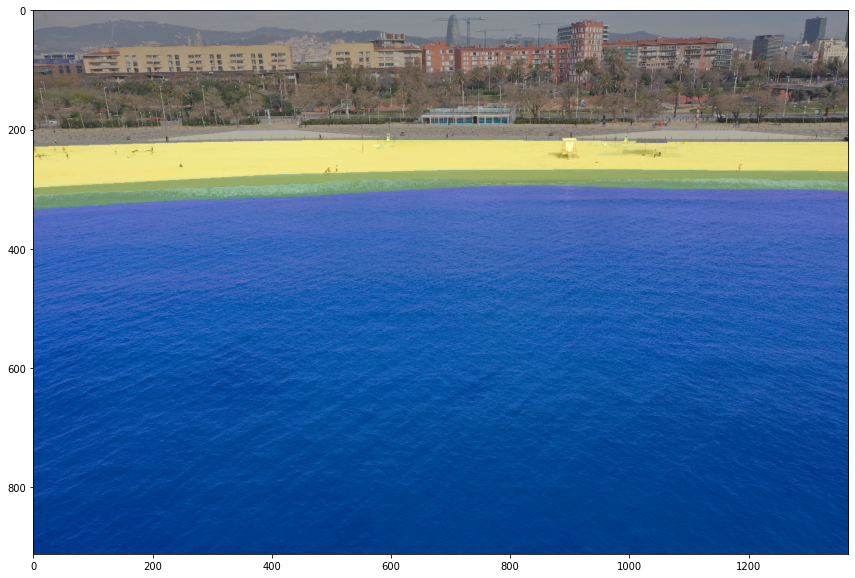

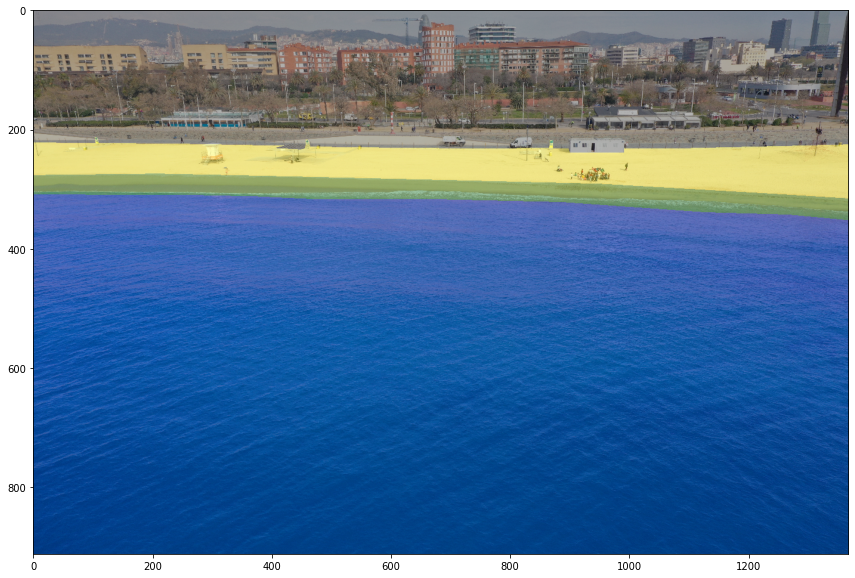

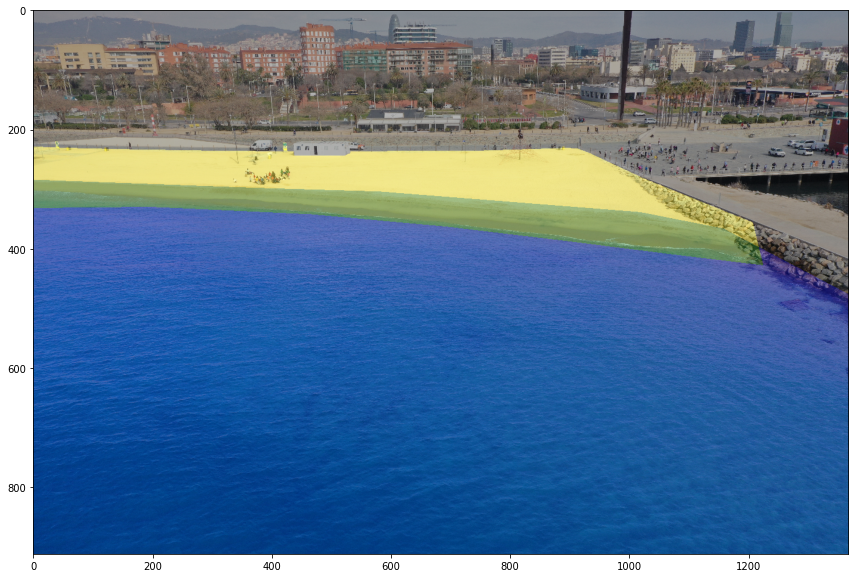

In [4]:

for input_, mask in zip(group_of_imgs, group_of_masks):
    #plt.imshow(input_)
    #plt.show()
    
    blend_img = cv2.cvtColor(color_mask(mask), cv2.COLOR_BGR2RGB)
    blend_img = cv2.addWeighted(input_, 0.7, blend_img, 0.3, 0)
    
    plt.imshow(blend_img)
    plt.show()
    

In [144]:

weights_path = 'extern/SuperPointPretrainedNetwork/superpoint_v1.pth'
radi = 5 # Radius of points

if False:
    descriptor = cv2.SIFT_create()
    point_finder_descriptor = lambda img : descriptor.detectAndCompute(img, None)
elif True:
    model = SuperPointFrontend(weights_path=weights_path, nms_dist=4, conf_thresh=0.015, nn_thresh=0.7, cuda=False)
    point_finder_descriptor = lambda img : apply_superpoints_eval(model, cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), radi)

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


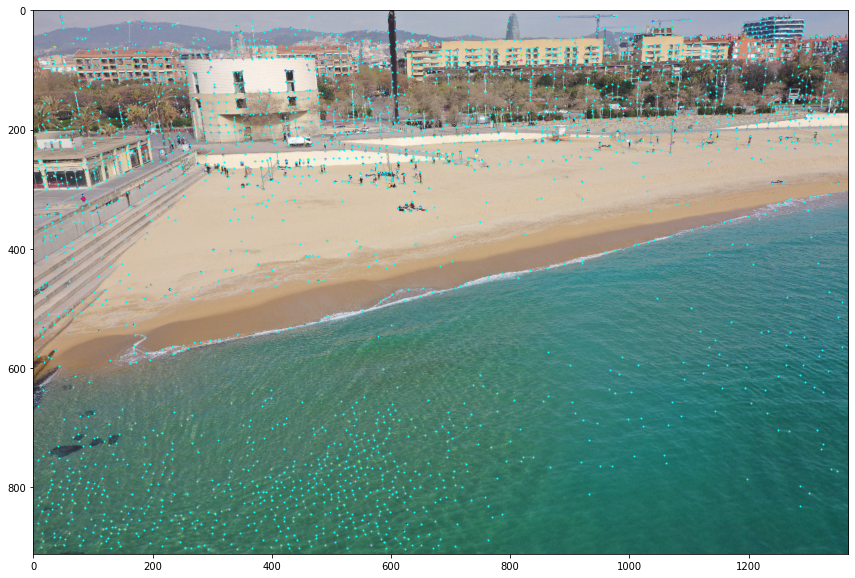

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


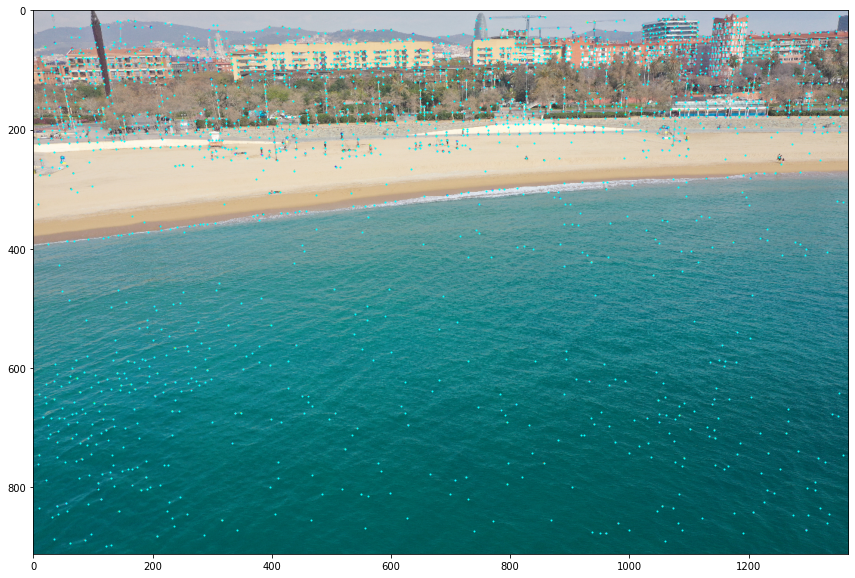

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


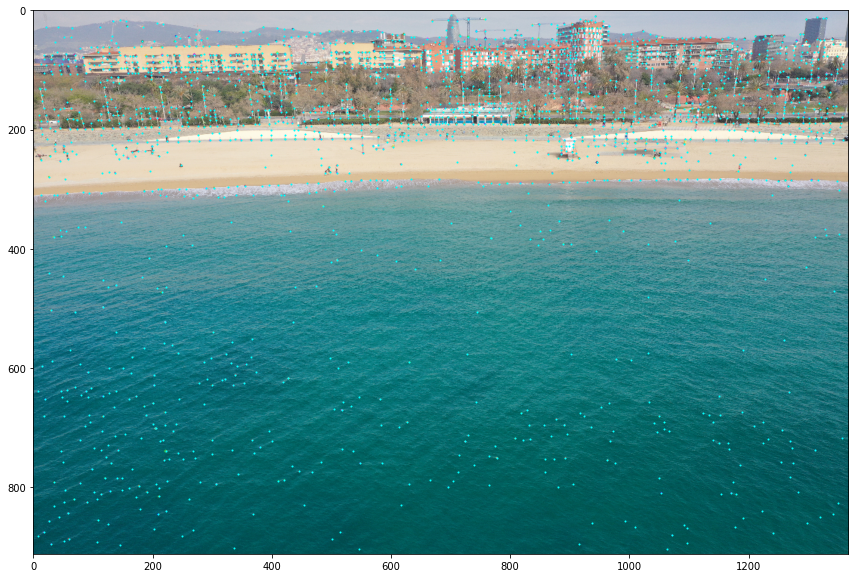

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


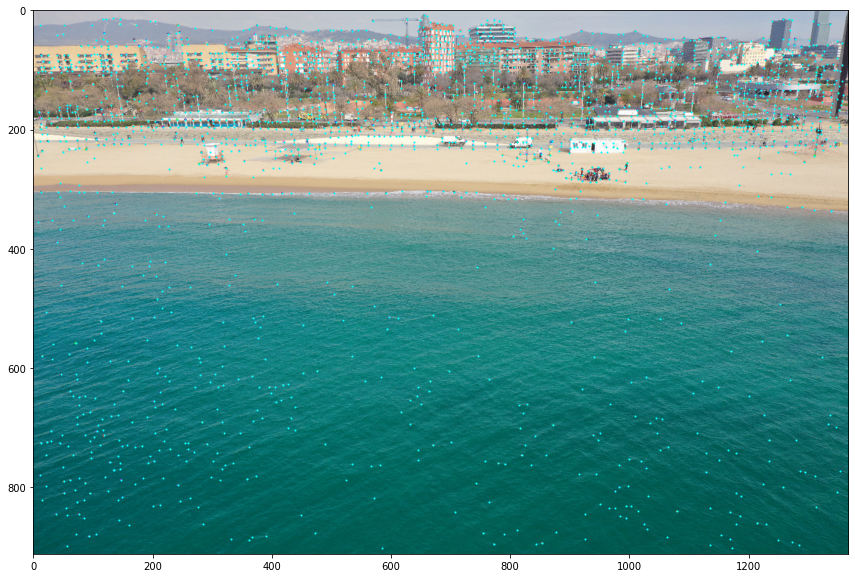

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


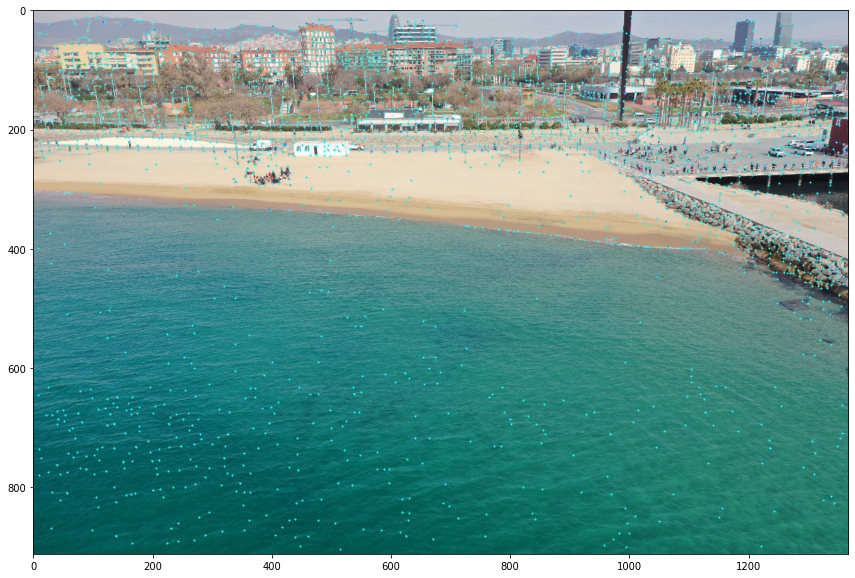

In [145]:

v_kp = []
v_des = []
v_pts = []

for input_ in group_of_imgs:
    kp, des = point_finder_descriptor(input_)
    output = np.zeros_like(input_)
    output = cv2.drawKeypoints(input_, kp , output, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    pts = np.array([k.pt for k in kp])
    
    plt.plot(pts[:, 0], pts[:, 1], color='cyan', marker='o', linestyle='None', markersize=1)
    plt.imshow(output)
    plt.show()
    
    v_kp.append(kp)
    v_des.append(des)
    v_pts.append(pts)
    


/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


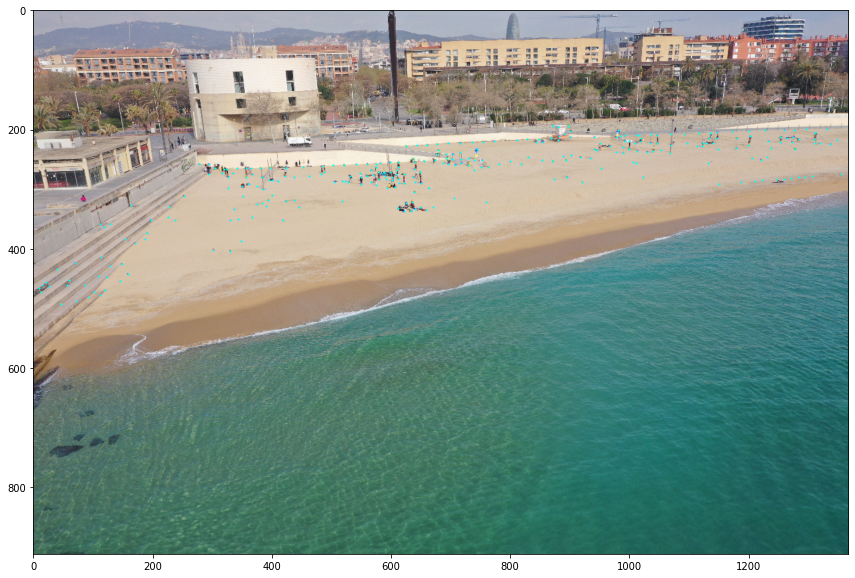

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


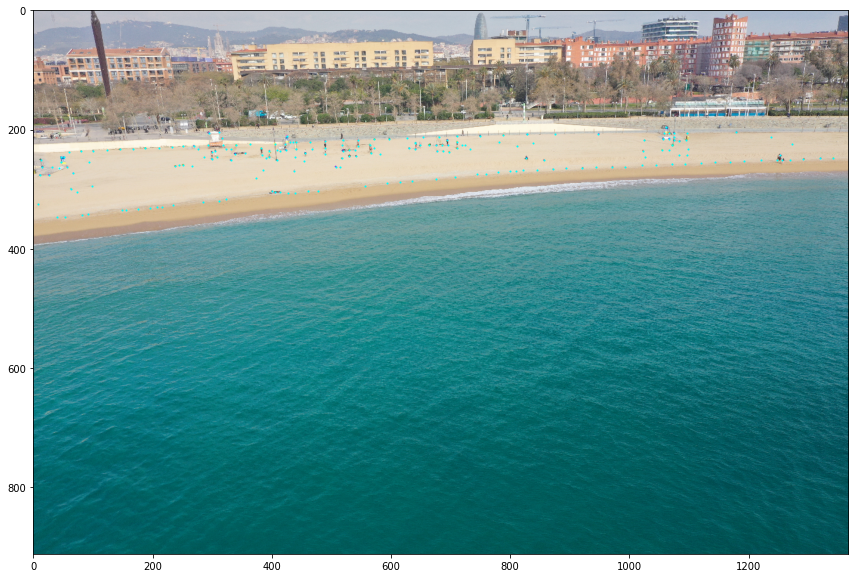

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


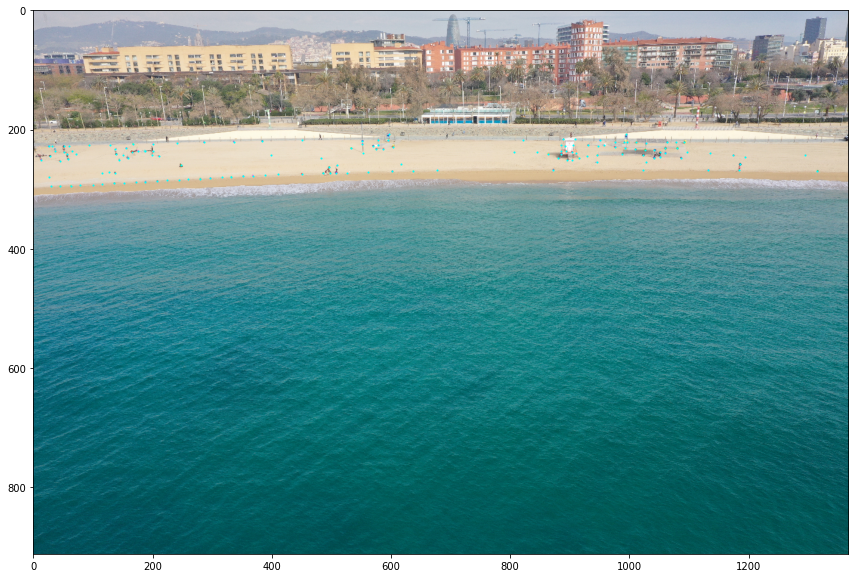

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


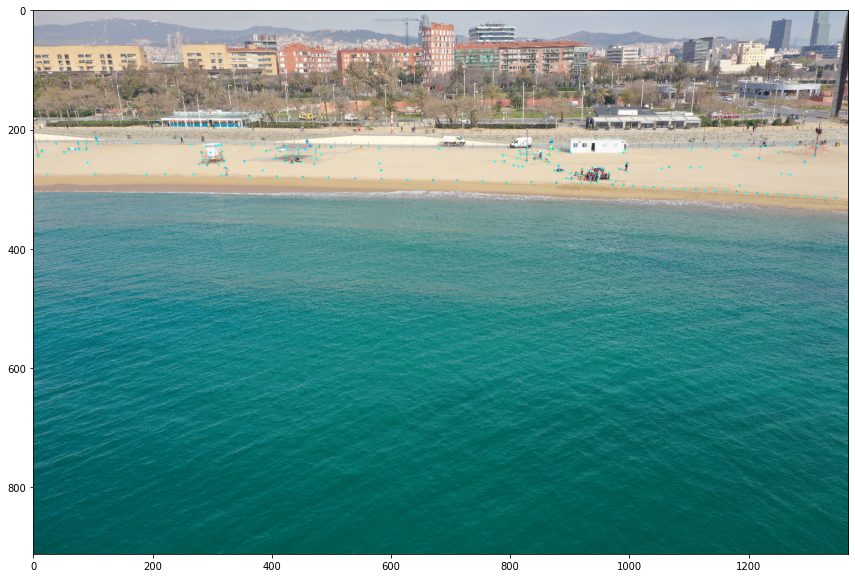

/home/ignasi/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


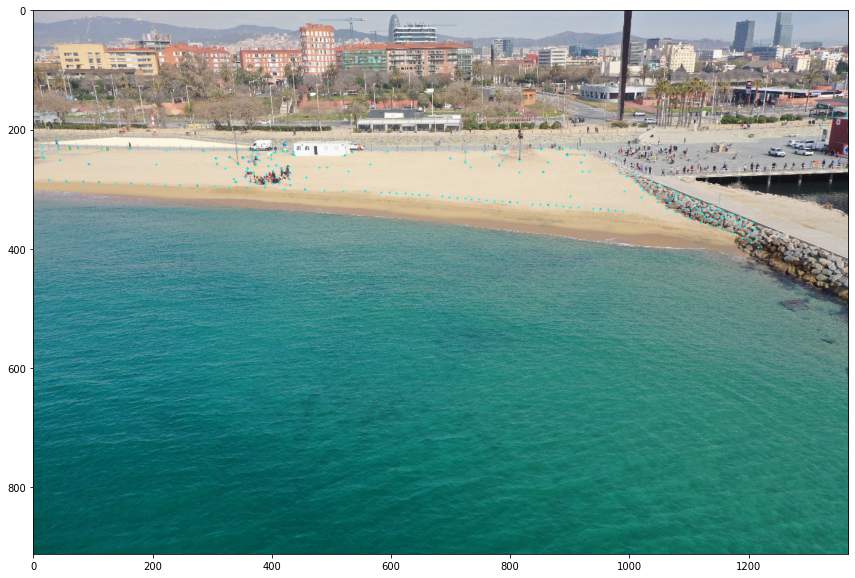

In [146]:

v_kp = []
v_des = []
v_pts = []

for ori_input_, mask in zip(group_of_imgs, group_of_masks):
    input_ = ori_input_.copy()
    input_[(mask == 0) | (mask == 1) | ((mask == 3)), :] = 0
    kp, des = point_finder_descriptor(input_)
    output = np.zeros_like(input_)
    output = cv2.drawKeypoints(ori_input_, kp , output, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    pts = np.array([k.pt for k in kp])
    
    plt.plot(pts[:, 0], pts[:, 1], color='cyan', marker='o', linestyle='None', markersize=1)
    plt.imshow(output)
    plt.show()
    
    v_kp.append(kp)
    v_des.append(des)
    v_pts.append(pts)
    

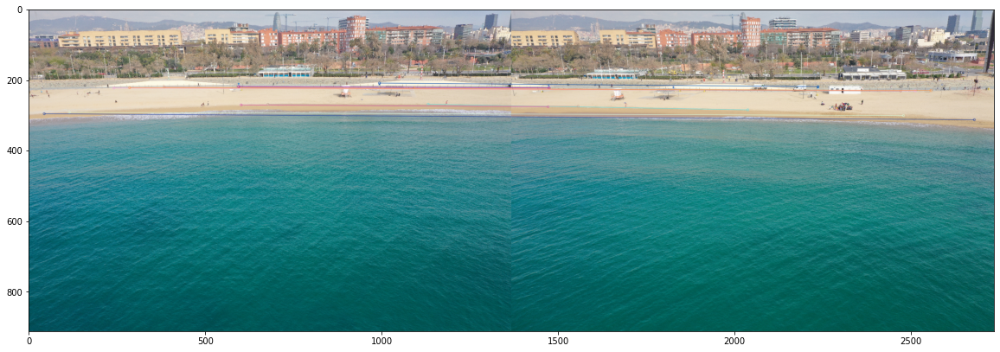

In [147]:

max_matches = 10

neg_idx_1 = -3
neg_idx_2 = neg_indx_1 + 1

assert (neg_indx_1 < -1) & ((-neg_indx_1) <= len(group_of_imgs))

#current_img = cv2.cvtColor(group_of_imgs[neg_idx_1], cv2.COLOR_RGB2GRAY)
current_img = group_of_imgs[neg_idx_1]
current_kp = v_kp[neg_idx_1]
#next_img = cv2.cvtColor(group_of_imgs[neg_idx_2], cv2.COLOR_RGB2GRAY)
next_img = group_of_imgs[neg_idx_2]
next_kp = v_kp[neg_idx_2]

find_match = lambda matches : matches[len(group_of_imgs) + neg_idx_1, len(group_of_imgs) + neg_idx_2]
find_H = lambda H : np.array(H[len(group_of_imgs) + neg_idx_1, len(group_of_imgs) + neg_idx_2]).astype(float)

bf = cv2.BFMatcher(crossCheck=True) # Brute Force Matcher
matrix_finder = RANSAC_MatrixFinder(point_matcher=bf, MIN_MATCH_COUNT=4, ransacReprojThreshold=5.0, maxIters=5)
    
H, n_matches, matches = batch_homographies(v_kp, v_des, matrix_finder, get_matches=True)

some_matches = find_match(matches)
some_H = find_H(H)
matches_sort = sorted(some_matches, key=lambda x : x.distance)
some_matches = matches_sort[:max_matches]

output = cv2.drawMatches(current_img, current_kp, next_img, next_kp, some_matches, None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(output)
plt.show()


[[ 1.16845991e-01 -5.08774160e-01  1.02057491e+02]
 [-9.69354976e-02 -1.40409160e-01  1.88890837e+02]
 [-3.65785956e-04 -1.64066291e-03  1.00000000e+00]]

h=1035	w=1368

(1035, 1368, 3)



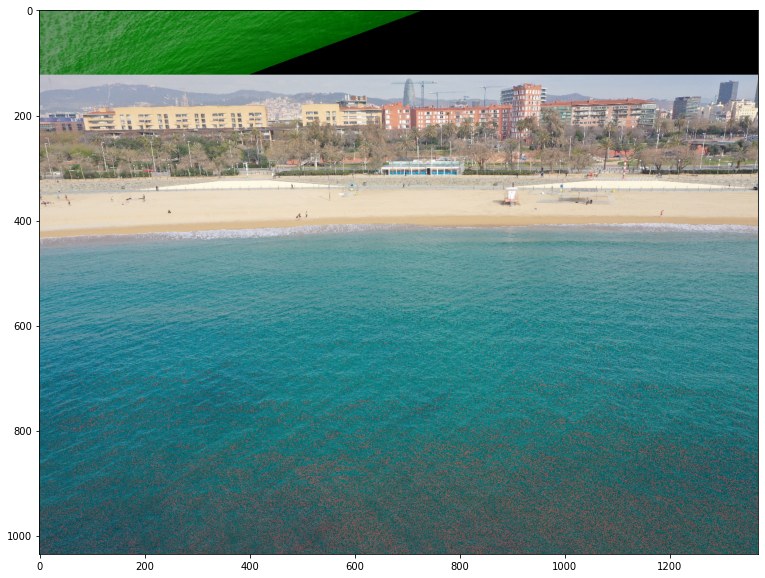

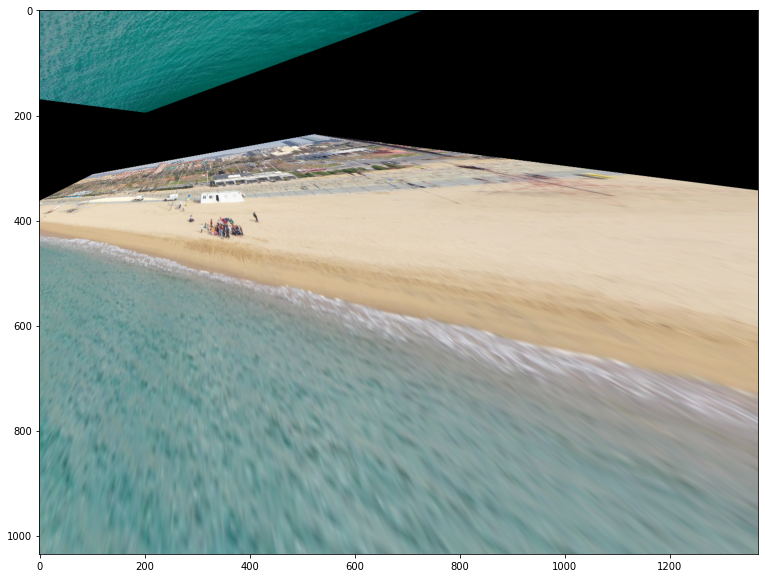

In [148]:

composed_img = current_img.copy()

max_x, min_x, max_y, min_y = compute_dimensions(cv2.cvtColor(current_img, cv2.COLOR_RGB2GRAY), cv2.cvtColor(next_img, cv2.COLOR_RGB2GRAY), some_H)
width = int(max_x - min_x + 1)
height = int(max_y - min_y + 1)

width = min(width, 8000)
height = min(height, 4000)

# 3- compute the transformation matrix for the current image (homography matrix from step 1 with current trtanslation)
translation_matrix = np.matrix([[1.0, 0.0, -min_x],[0.0, 1.0, -min_y],[0.0, 0.0, 1.0]])
H2 = translation_matrix * some_H # * image

# 5- applying the transformation
composed_img_R = cv2.warpPerspective(composed_img[:, :, 0], translation_matrix, (width, height), flags=cv2.INTER_LINEAR)
composed_img_G = cv2.warpPerspective(composed_img[:, :, 1], translation_matrix, (width, height), flags=cv2.INTER_LINEAR)
composed_img_B = cv2.warpPerspective(composed_img[:, :, 2], translation_matrix, (width, height), flags=cv2.INTER_LINEAR)

sticher_img_R = cv2.warpPerspective(next_img[:, :, 0], H2, (width, height), flags=cv2.INTER_LINEAR)
sticher_img_G = cv2.warpPerspective(next_img[:, :, 1], H2, (width, height), flags=cv2.INTER_LINEAR)
sticher_img_B = cv2.warpPerspective(next_img[:, :, 2], H2, (width, height), flags=cv2.INTER_LINEAR)

composed_img = np.dstack((composed_img_R, composed_img_G, composed_img_B))
sticher_img = np.dstack((sticher_img_R, sticher_img_G, sticher_img_B))

composed_img[composed_img_R == 0, 0] = sticher_img_R[composed_img_R == 0]
composed_img[composed_img_G == 0, 1] = sticher_img_G[composed_img_G == 0]
composed_img[composed_img_B == 0, 2] = sticher_img_R[composed_img_B == 0]

print(some_H, end='\n\n')
print(f'h={height}\tw={width}', end='\n\n')
print(composed_img.shape, end='\n\n')

plt.imshow(composed_img)
plt.show()

plt.imshow(sticher_img)
plt.show()